## Import Libraries

In [ ]:
import sys
from setuptools import setup, find_packages

package_path = '/content/drive/MyDrive/DIP-Noising-Denoising/core'
sys.path.append(package_path)

import util as ut

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import PIL
import requests
from io import BytesIO
import sys
from PIL import Image

import util as ut

## Show Image

In [ ]:
img= cv2.imread("/content/drive/MyDrive/DIP-Noising-Denoising/Images/Avesina-Tomb.jpg")

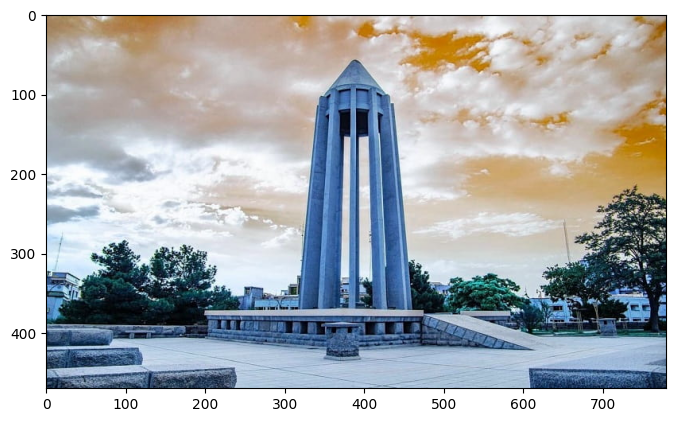

In [ ]:
ut.show_img_plt(img)

In [ ]:
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

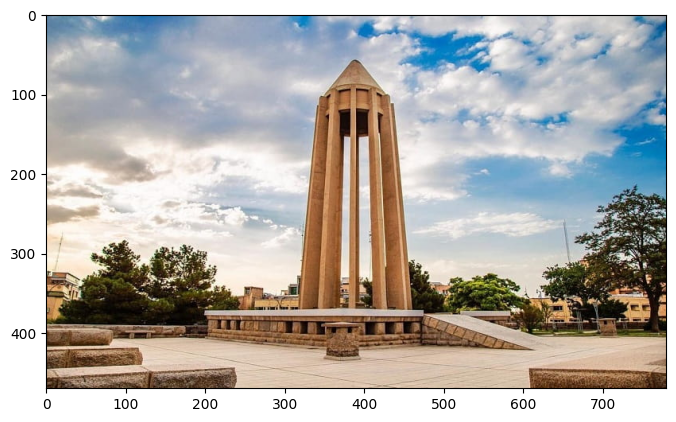

In [ ]:
ut.show_img_plt(image)

## Add Noise

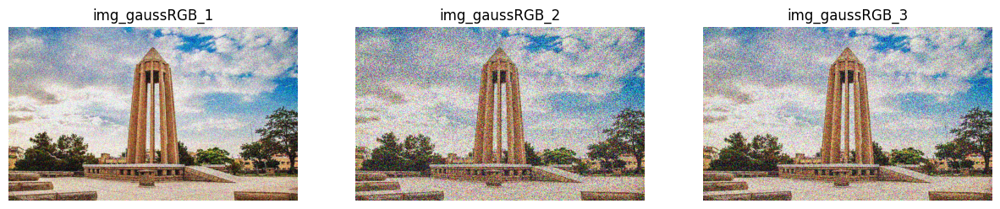

In [ ]:
img_gaussRGB_1= ut.add_gaussianRGB(image, mean=0, std=50)
img_gaussRGB_2= ut.add_gaussianRGB(image, mean=1, std=100)
img_gaussRGB_3= ut.add_gaussianRGB(image, mean=2, std=80)
ut.show_mult_img(1, 3, [img_gaussRGB_1 , img_gaussRGB_2 , img_gaussRGB_3],['img_gaussRGB_1' , 'img_gaussRGB_2' , 'img_gaussRGB_3'])

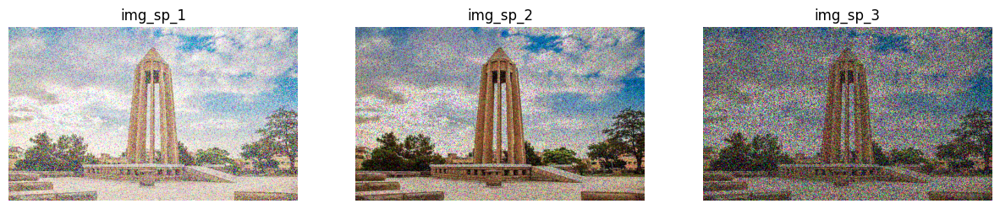

In [ ]:
img_sp_1= ut.ImageNoise(image).add_noise('s&p', s_vs_p =0.9 , amount = 0.5)
img_sp_2= ut.ImageNoise(image).add_noise('s&p', s_vs_p =0.2 , amount = 0.24)
img_sp_3= ut.ImageNoise(image).add_noise('s&p', s_vs_p =0.3 , amount = 0.8)
ut.show_mult_img(1, 3, [img_sp_1 , img_sp_2 , img_sp_3],['img_sp_1' , 'img_sp_2' , 'img_sp_3'])

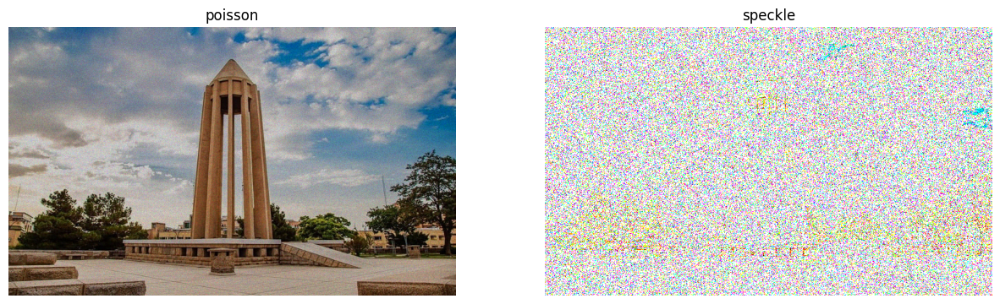

In [ ]:
img_poiss= ut.ImageNoise(image).add_noise('poisson')
img_speck=ut.ImageNoise(image).add_noise('speckle')
ut.show_mult_img(1, 2, [img_poiss , img_speck],['poisson' , 'speckle'])

## Filters

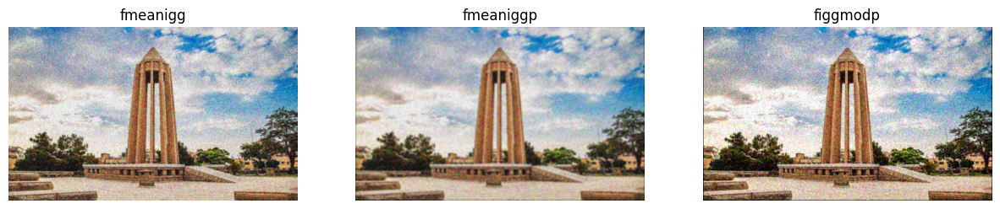

In [ ]:
fmeaniggp = ut.SpatialFilter(img_gaussRGB_1).apply_filter('mean',   5, 1)
fmeanigg  = ut.SpatialFilter(img_gaussRGB_1).apply_filter('mean',   3, 0)
figgmodp  = ut.SpatialFilter(np.uint8(img_gaussRGB_1)).apply_filter('median', 3, 1)
ut.show_mult_img(1, 3, [fmeanigg, fmeaniggp, figgmodp], ['fmeanigg', 'fmeaniggp', 'figgmodp'])

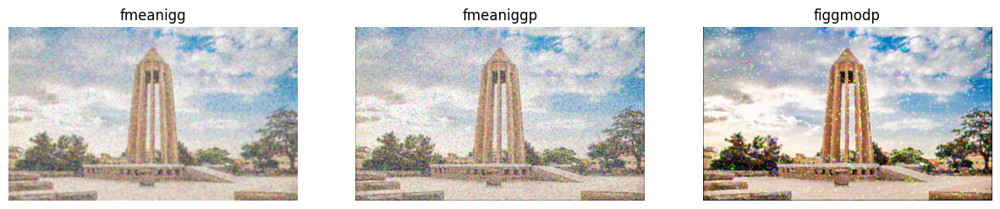

In [ ]:
fmeaniggp = ut.SpatialFilter(img_sp_1).apply_filter('mean',   3, 1)
fmeanigg  = ut.SpatialFilter(img_sp_1).apply_filter('mean',   5, 0)
figgmodp  = ut.SpatialFilter(np.uint8(img_sp_1)).apply_filter('median', 5, 1)
ut.show_mult_img(1, 3, [fmeanigg, fmeaniggp, figgmodp], ['fmeanigg', 'fmeaniggp', 'figgmodp'])

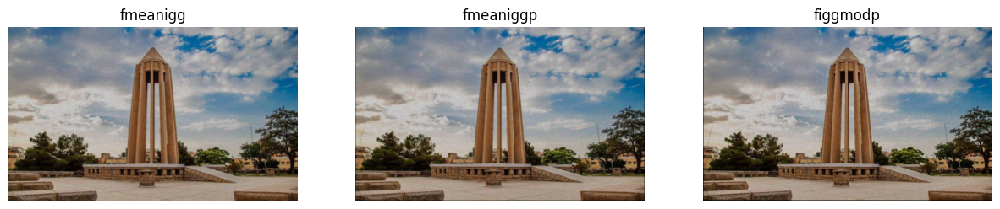

In [ ]:
fmeaniggp = ut.SpatialFilter(img_poiss).apply_filter('mean',   3, 1)
fmeanigg  = ut.SpatialFilter(img_poiss).apply_filter('mean',   3, 0)
figgmodp  = ut.SpatialFilter(np.uint8(img_poiss)).apply_filter('median', 3, 1)
ut.show_mult_img(1, 3, [fmeanigg, fmeaniggp, figgmodp], ['fmeanigg', 'fmeaniggp', 'figgmodp'])

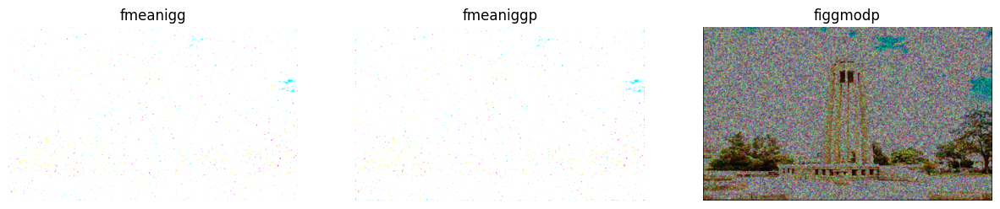

In [ ]:
fmeaniggp = ut.SpatialFilter(img_speck).apply_filter('mean',   3, 1)
fmeanigg  = ut.SpatialFilter(img_speck).apply_filter('mean',   3, 0)
figgmodp  = ut.SpatialFilter(np.uint8(img_speck)).apply_filter('median', 3, 1)
ut.show_mult_img(1, 3, [fmeanigg, fmeaniggp, figgmodp], ['fmeanigg', 'fmeaniggp', 'figgmodp'])

## Frequency Filters

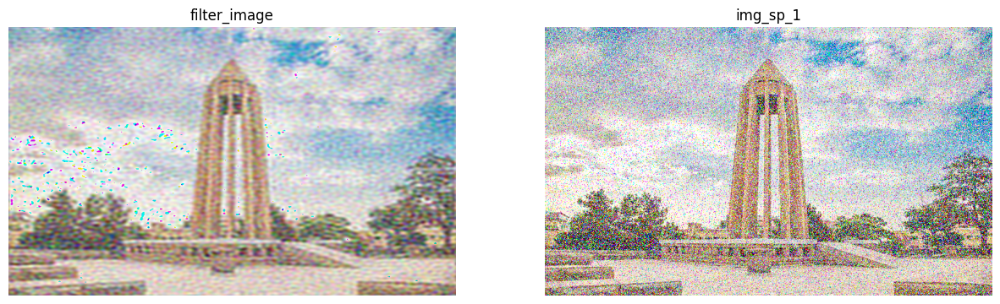

In [ ]:
frequency = ut.FrequencyFilterRGB(img_sp_1)
filter_image = frequency.low_pass_filter(70)
ut.show_mult_img(1, 2, [filter_image, img_sp_1], ['filter_image', 'img_sp_1'])

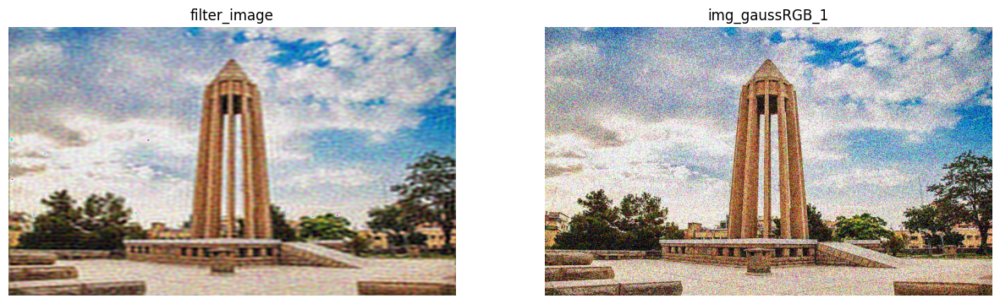

In [ ]:
frequency = ut.FrequencyFilterRGB(img_gaussRGB_1)
filter_image = frequency.low_pass_filter(73)
ut.show_mult_img(1, 2, [filter_image, img_gaussRGB_1], ['filter_image', 'img_gaussRGB_1'])

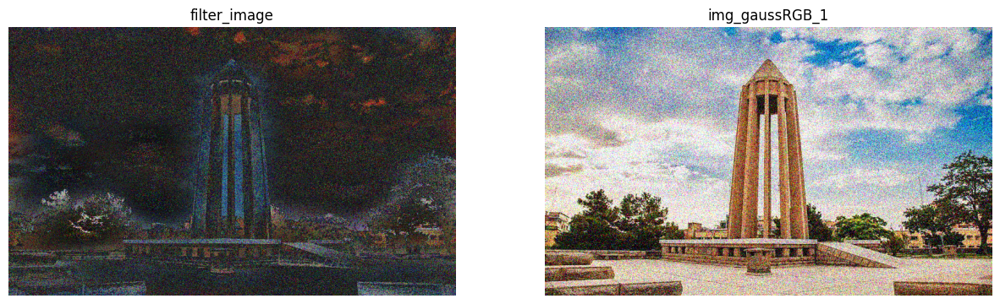

In [ ]:
frequency = ut.FrequencyFilterRGB(img_gaussRGB_1)
filter_image = frequency.high_pass_filter(5)
ut.show_mult_img(1, 2, [filter_image, img_gaussRGB_1], ['filter_image', 'img_gaussRGB_1'])

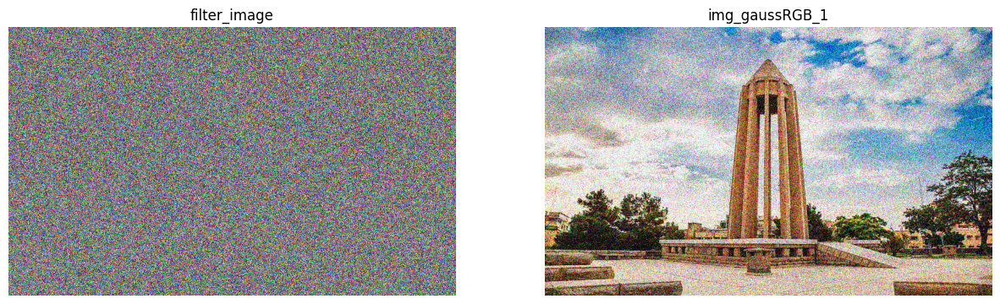

In [ ]:
frequency = ut.FrequencyFilterRGB(img_gaussRGB_1)
filter_image = frequency.band_pass_filter(50,60)
ut.show_mult_img(1, 2, [filter_image, img_gaussRGB_1], ['filter_image', 'img_gaussRGB_1'])

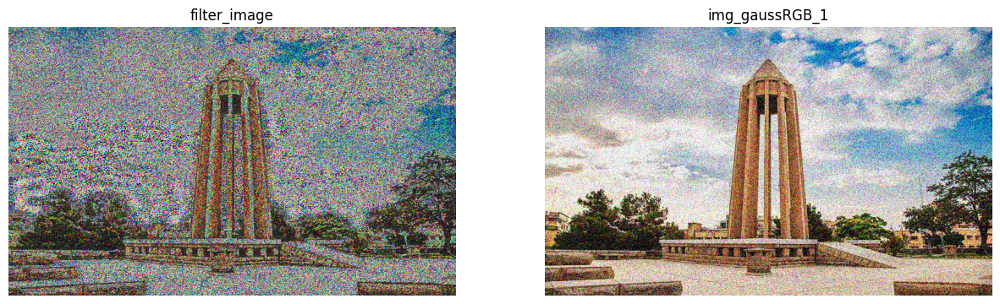

In [ ]:
frequency = ut.FrequencyFilterRGB(img_gaussRGB_1)
filter_image = frequency.band_reject_filter(20,200)
ut.show_mult_img(1, 2, [filter_image, img_gaussRGB_1], ['filter_image', 'img_gaussRGB_1'])

## Point Processing

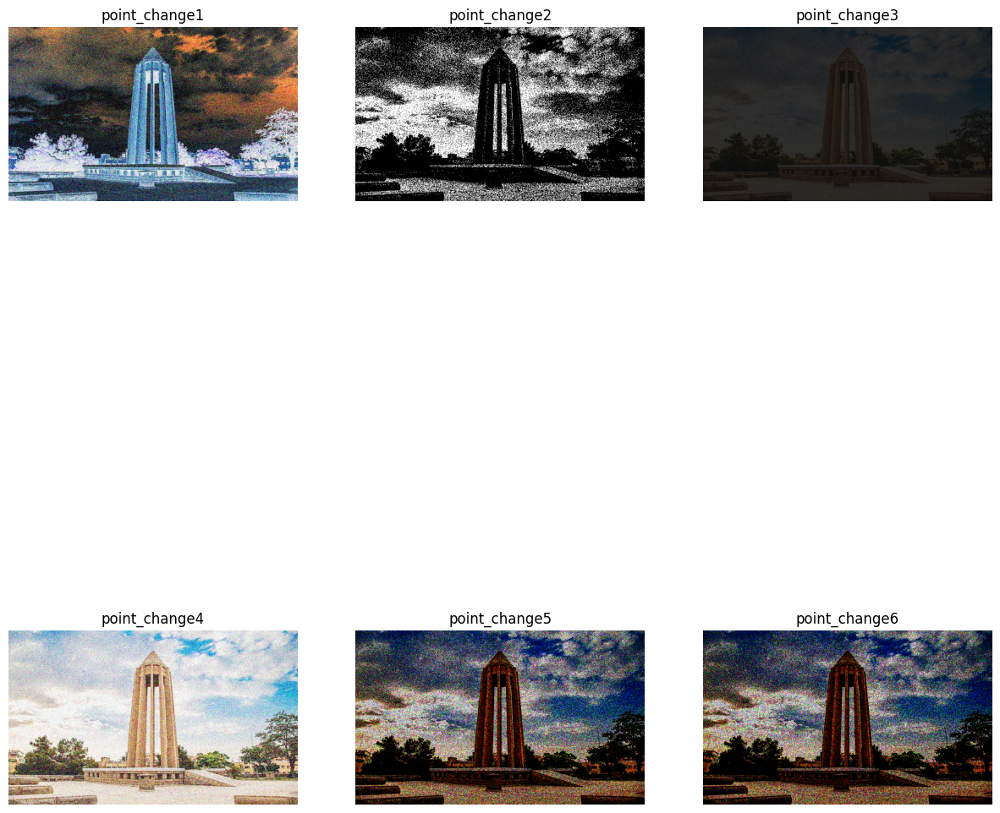

In [ ]:
point_point = ut.PointProcessing(img_gaussRGB_1)
point_change1 = point_point.apply_negative()
point_change2 = point_point.apply_threshold(200)
point_change3 = point_point.apply_contrast_stretching(10, 50)
point_change4 = point_point.apply_gamma_correction(0.5)
point_change5 = point_point.apply_gamma_correction(5)
point_change6 = point_point.apply_gamma_correction(6)
ut.show_mult_img(2, 3, [point_change1, point_change2, point_change3, point_change4, point_change5, point_change6], ['point_change1', 'point_change2', 'point_change3', 'point_change4', 'point_change5', 'point_change6'])


## Histogram

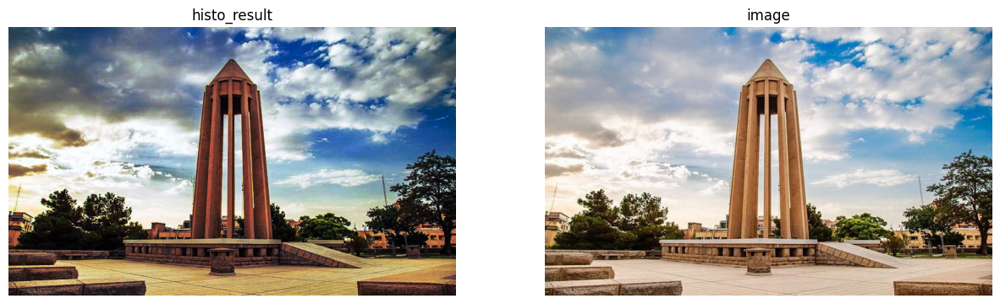

In [ ]:
histo_image  = ut.HistogramEnhancement(image)
histo_result = histo_image.apply_histogram_equalization()
ut.show_mult_img(1, 2, [histo_result, image], ['histo_result', 'image'])

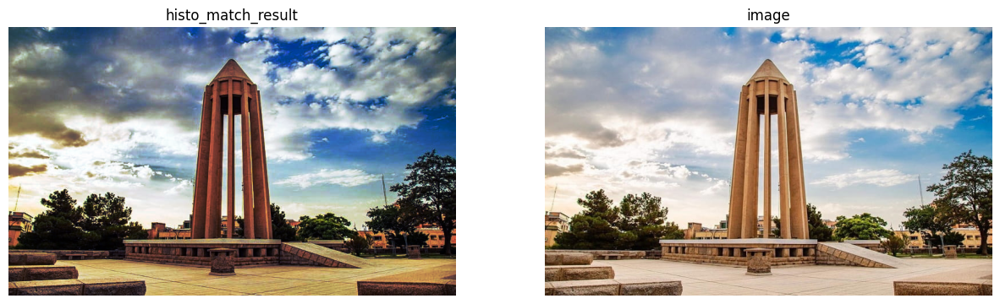

In [ ]:
histo_image  = ut.HistogramEnhancement(image)
histo_result_match = histo_image.apply_histogram_matching(point_change1)
ut.show_mult_img(1, 2, [histo_result, image], ['histo_match_result', 'image'])

## Compress Images

In [ ]:
class ImageCompression:
    def __init__(self, image):
        self.image = image

    def compress_using_jpeg(self, quality):
        """
        Compresses the image using JPEG compression.
        :param quality: Compression quality (0-100), higher value means better quality.
        """
        encoded_image, compressed_image = cv2.imencode('.jpg', self.image, [int(cv2.IMWRITE_JPEG_QUALITY), quality])
        return compressed_image

    def compress_using_png(self, compression_level):
        """
        Compresses the image using PNG compression.
        :param compression_level: Compression level (0-9), higher value means higher compression.
        """
        encoded_image, compressed_image = cv2.imencode('.png', self.image, [int(cv2.IMWRITE_PNG_COMPRESSION), compression_level])
        return compressed_image
    def compress_using_huffman(self):
        pass


In [ ]:
comp_img  = ImageCompression(image)
comp_jpeg = comp_img.compress_using_jpeg(100)
comp_png  = comp_img.compress_using_png(9)
print(f"Size of jpeg: {sys.getsizeof(image)} bytes")
print(f"Size of jpeg: {sys.getsizeof(comp_jpeg)} bytes")
print(f"Size of png : {sys.getsizeof(comp_png)} bytes")

Size of jpeg: 1099944 bytes
Size of jpeg: 228146 bytes
Size of png : 520718 bytes


In [ ]:
import cv2
from skimage.metrics import structural_similarity as ssim

def calculate_ssim(original_img, denoised_img):
    # Convert images to float32 (required for MSSIM calculation)
    original_float = original_img.astype(np.float32) / 255.0
    denoised_float = denoised_img.astype(np.float32) / 255.0

    # Calculate MSSIM between the two RGB images
    ssim_score, _ = ssim(original_float, denoised_float, multichannel=True, full=True)

    return ssim_score

## SSIM Score

In [ ]:

original_image = cv2.imread("/content/drive/MyDrive/DIP-Noising-Denoising/Images/Original Image.png")
denoised_image_gamma = cv2.imread("/content/drive/MyDrive/DIP-Noising-Denoising/Images/gamma4.png")
denoised_image_histo = cv2.imread("/content/drive/MyDrive/DIP-Noising-Denoising/Images/histo.png")
denoised_image_lpf = cv2.imread("/content/drive/MyDrive/DIP-Noising-Denoising/Images/lp-gauss.png")



# Calculate the SSIM score
ssim_score_gamma = calculate_ssim(original_image, denoised_image_gamma)
ssim_score_histo = calculate_ssim(original_image, denoised_image_histo)
ssim_score_lpf = calculate_ssim(original_image, denoised_image_lpf)

print(["SSIM Score gamma:", ssim_score_gamma ,"SSIM Score histo:", ssim_score_histo , "SSIM Score lpf:", ssim_score_lpf] )


<ipython-input-24-7941cf73a8b4>:10: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_score, _ = ssim(original_float, denoised_float, multichannel=True, full=True)


['SSIM Score gamma:', 0.6306647, 'SSIM Score histo:', 0.87821054, 'SSIM Score lpf:', 0.8001942]
